<h1 align="center"><font size="8"> scVelo Differential Analysis </font></h1>

> Huitian (Yolanda) Diao, March 31th 2020 <br>
> Source: [Velocyto notebook](https://github.com/velocyto-team/velocyto-notebooks.git)


- vlm object:
    - Gene IDs: vlm.ra['Gene']
    - Cell IDs: vlm.ca['CellID']

In [4]:
import os
import pandas as pd
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
import copy

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

import scvelo as scv
scv.logging.print_version()

code_dir = '/media/pipkin/Yolanda/Exp391_Acute-Chronic_SC/0_codes_local'
os.chdir(code_dir)

import scVelo_rankVelocity_withpval


scv.settings.verbosity = 0  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.set_figure_params('scvelo')  # for beautified visualization

%matplotlib inline

Running scvelo 0.2.0 (python 3.7.6) on 2020-06-10 19:45.


-----

### Info: Exp391 Velocity Level Differential Analysis
1. **Top likelihood ('Driver' genes)**

    1.1 In all cells
        1.1.1 All cells
        1.1.2 Each louvain cluster
        1.1.3 Each cell type
    1.2 Pairwise
        1.2.1 Cluster v.s. Cluster
        1.2.2 Condition v.s. Condition (Armstrong / Clone13 / Naive each time point one v.s. one)
        1.2.3 Cell type v.s. Cell type
        1.2.4 Within cluster Armstrong v.s. Clone13
        
2. **Differntial kenetics genes**

    2.1 In all cells
        Each louvain cluster
    2.2 Pairwise
        2.2.1 Cluster v.s. Cluster
        2.2.2 Condition v.s. Condition (Armstrong / Clone13 / Naive each time point one v.s. one)
        2.2.3 Cell type v.s. Cell type
        2.2.4 Within cluster Armstrong v.s. Clone13

-----

## 0. Read Velocyto Loom file

In [5]:
wkdir = '/media/pipkin/Yolanda/Exp391_Acute-Chronic_SC/1_2_scVelo'
os.chdir(wkdir)

h5ad_file = 'Exp391_scVelo.h5ad'
adata = scv.read(h5ad_file)

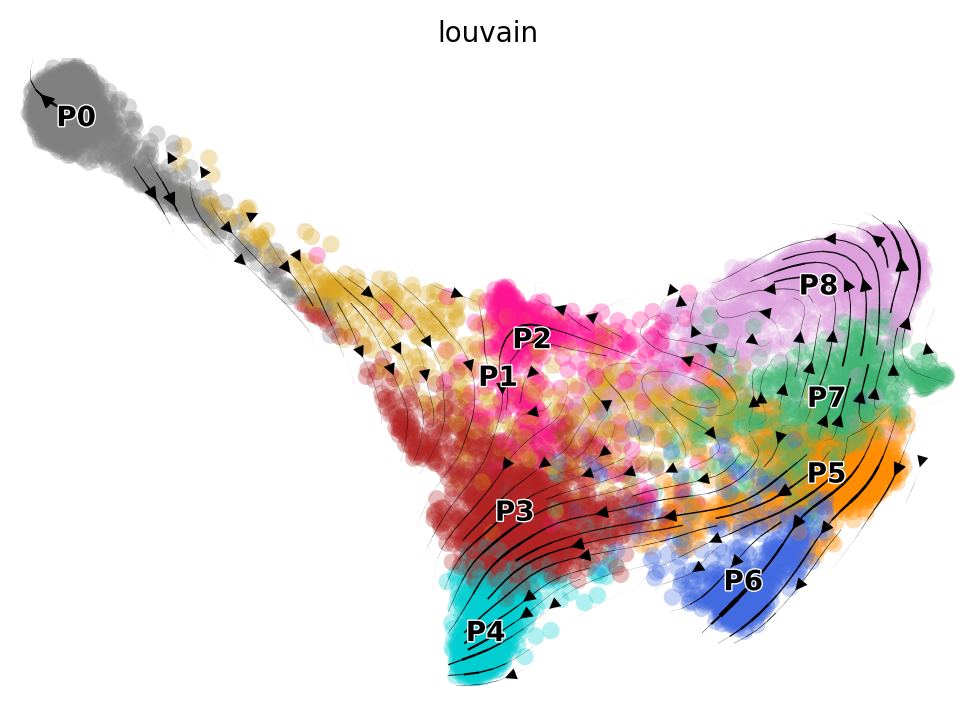

In [6]:
scv.pl.velocity_embedding_stream(adata, basis='paga', color=['louvain'], dpi=100)

-----

<h1 align="center"><font size="6"> 1. Identify top-likelihood genes ('Driver' genes) with Dynamical Modeling </font></h1>

In [7]:
likelihood_dir = "%s/1_likelihood"%wkdir
os.chdir(likelihood_dir)

## 1.1 Top-likelihood Genes in All cells

In [8]:
os.chdir(likelihood_dir)
if not os.path.exists('all'):
        os.mkdir('all')
os.chdir('all')

### 1.1.1 Top likelihood genes in all cells

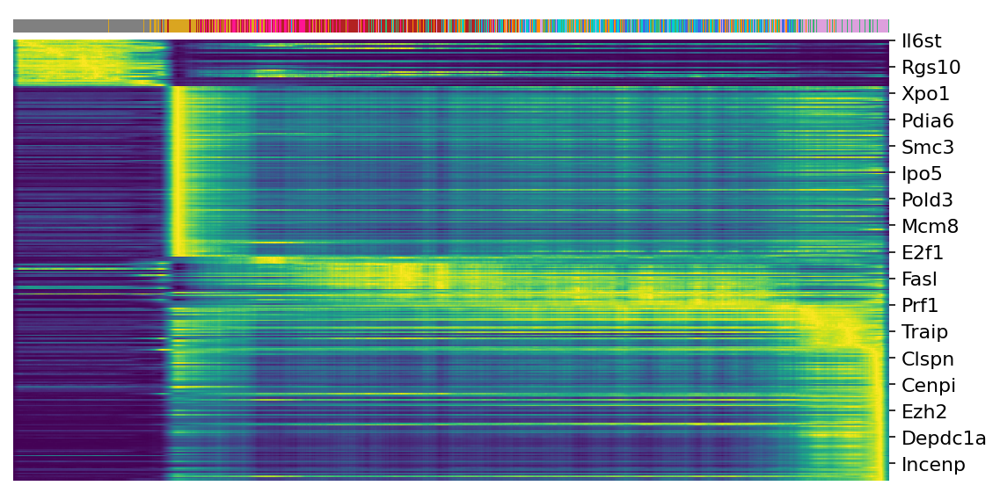

In [9]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
out_name = "topLikelihood.csv"
fit_likelihood_df = pd.DataFrame(adata.var['fit_likelihood'])
fit_likelihood_df = fit_likelihood_df.sort_values("fit_likelihood")
fit_likelihood_df.to_csv(out_name)

heatmap_name = "topLikelihood-pseudotime.png"
scv.pl.heatmap(adata, var_names=top_genes, sortby='dpt_pseudotime', col_color='louvain', n_convolve=100, figsize=(8,4), save=heatmap_name)

### 1.1.2 Top likelihood genes by louvain clusters

        P0        P1        P2        P3        P4      P5      P6      P7  \
0    Pdia3      Gmnn    Il18r1     Ddx39    Pycard   Ddx39    Nasp    Kif4   
1  St6gal1  Rnaseh2b     Crip1      Orc6    Ablim1  Nap1l1  Nap1l1   Ddx39   
2     Aff3     Lmnb1    Snrpd1  Rnaseh2b     Rbbp7    Gmnn  Pycard    Orc6   
3     Jak1      Kif4      Hcst      Nasp  Serpinb9    Nasp   Crip1  Lgals1   
4     Sell      Nsd2  Serpinb9    Pycard    Hnrnpd   Tipin  Il18r1    Rrm2   

      P8  
0  Ddx39  
1    Dut  
2   Rrm1  
3  Uhrf1  
4   Lig1  


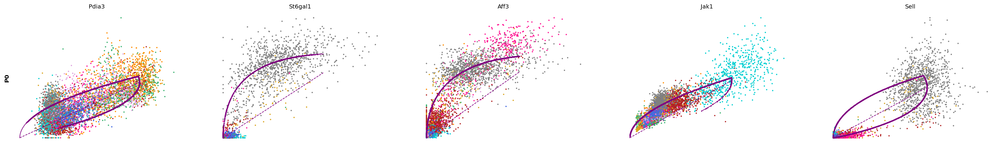

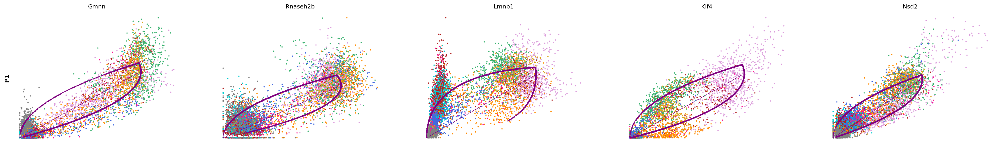

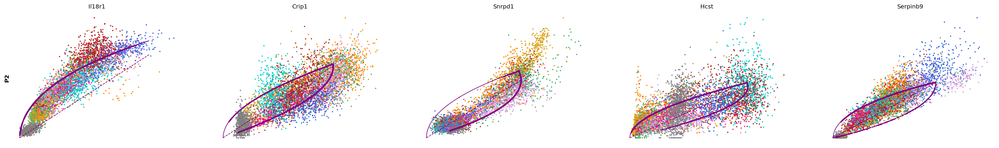

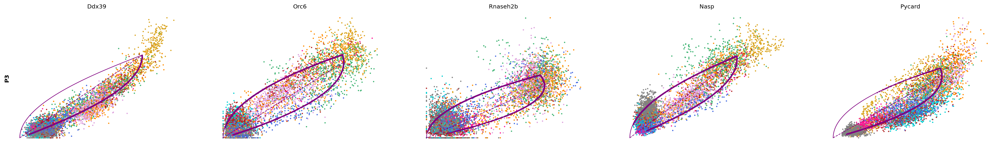

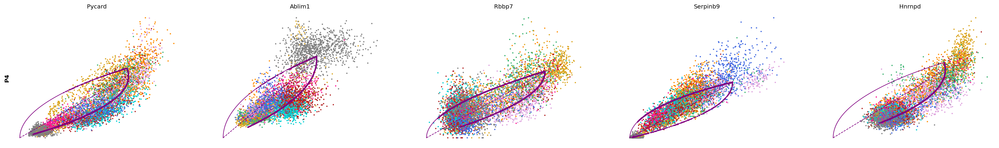

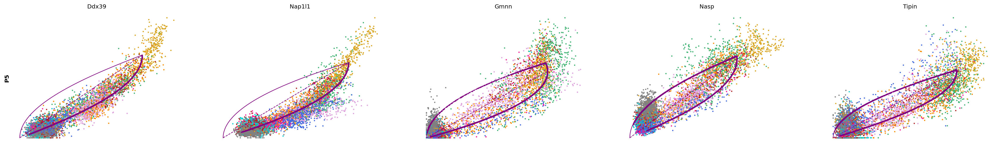

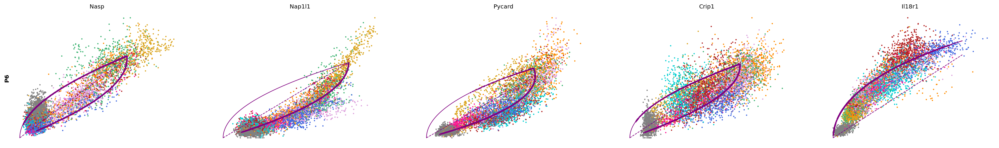

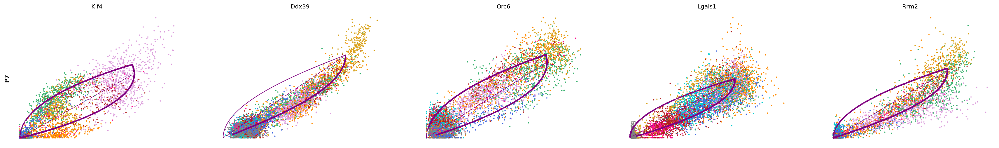

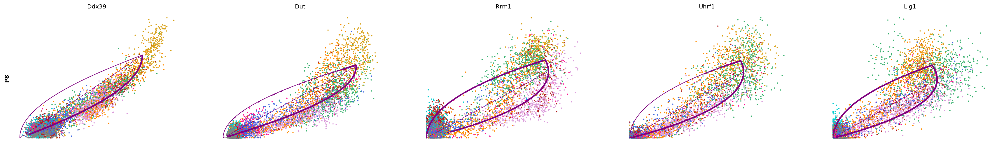

In [10]:
out_name = "topLikelihood_byLouvain.csv"
scv.tl.rank_dynamical_genes(adata, groupby='louvain')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
print(df.head())
df.to_csv(out_name, index=False)

for cluster in list(df.columns):
    scv.pl.scatter(adata, df[cluster][:5], ylabel=cluster, frameon=False)

### 1.1.3 Top likelihood genes by cell type

     A5P    A5T       A8P       A8T     C5P    C8P    NP14B
0   Kif4   Kif4    Pycard    Pycard   Ddx39   Gmnn    Pdia3
1  Ctla4  Tipin    S100a6    S100a6  Nap1l1   Nasp  St6gal1
2   Gmnn  Ctla4     Rbbp7     Rbbp7    Rrm2   Rrm1    Hspa5
3  Atxn1   Rrm1    Ablim1    Ablim1  Il18r1  Ddx39   Phf21a
4   Orc6   Gmnn  Serpinb9  Serpinb9    Kif4  Crip1     Jak1


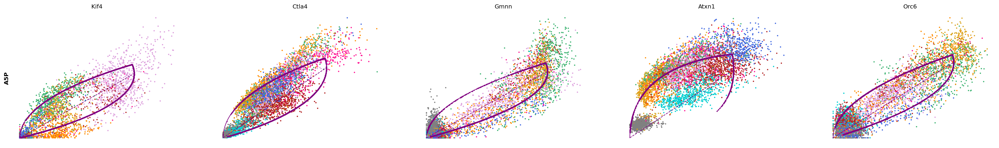

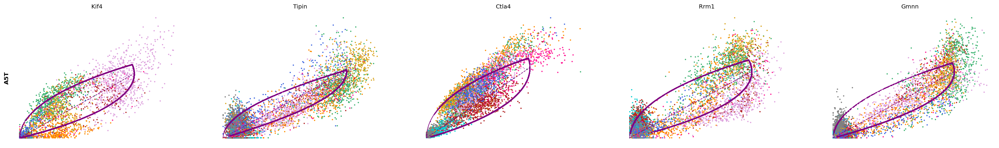

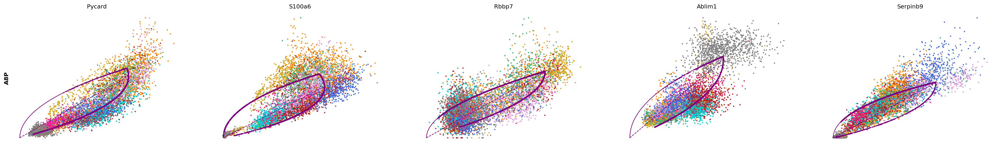

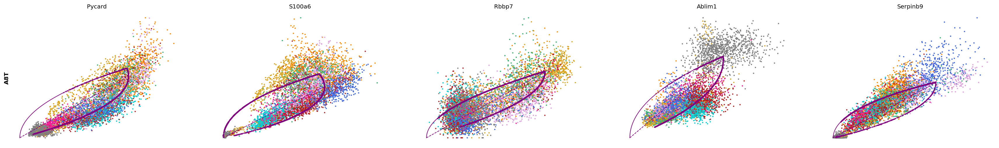

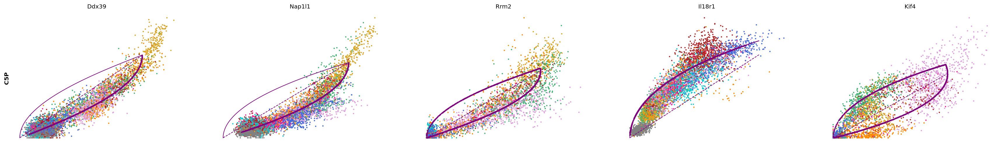

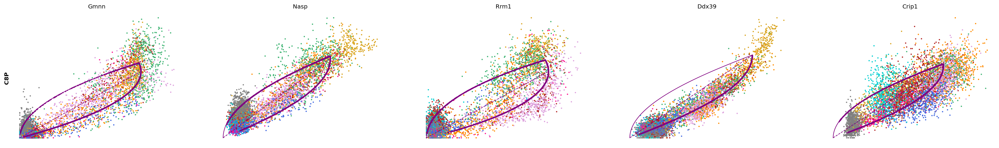

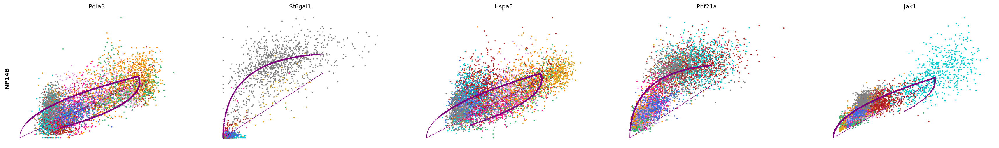

In [11]:
out_name = "topLikelihood_byCellType.csv"
scv.tl.rank_dynamical_genes(adata, groupby='cell_type')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
print(df.head())
df.to_csv(out_name, index=False)

for cluster in list(df.columns):
    scv.pl.scatter(adata, df[cluster][:5], ylabel=cluster, frameon=False)

## 1.2 Pairwise top likelihood

### 1.2.1 Cluster v.s. Cluster

In [ ]:
cluster_dir = '%s/Cluster_vs_Cluster'%likelihood_dir
if not os.path.exists(cluster_dir):
    os.mkdir(cluster_dir)
os.chdir(cluster_dir)

use_key='louvain'

cond_uniq = list(set(adata.obs[use_key]))

for l1 in cond_uniq:
    # Make a new folder for each cluster
    os.chdir(cluster_dir)
    if not os.path.exists(l1):
        os.mkdir(l1)
    os.chdir(l1)
    for l2 in cond_uniq:
        if l1 != l2:
            adata_use = adata.copy()
            adata_use =  adata_use[[True if x in [l1, l2] else False for x in adata_use.obs[use_key] ], :]
            out_name = "%s-%s_topLikelihood.csv"%(l1, l2)
            
            scv.tl.rank_dynamical_genes(adata_use, groupby=use_key, n_genes=adata.n_vars)
            df = scv.get_df(adata_use, 'rank_dynamical_genes/names')
            df.to_csv(out_name, index=False)

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


### 1.2.2 Condition v.s. Condition

In [ ]:
cluster_dir = '%s/Condition_vs_Condition'%likelihood_dir
if not os.path.exists(cluster_dir):
    os.mkdir(cluster_dir)
os.chdir(cluster_dir)

use_key = 'cell_type'

cond_uniq = list(set(adata.obs['cell_type']))

for l1 in cond_uniq:
    # Make a new folder for each cluster
    os.chdir(cluster_dir)
    if not os.path.exists(l1):
        os.mkdir(l1)
    os.chdir(l1)
    for l2 in cond_uniq:
        if l1 != l2:
            adata_use = adata.copy()
            adata_use =  adata_use[[True if x in [l1, l2] else False for x in adata_use.obs[use_key] ], :]
            out_name = "%s-%s_topLikelihood.csv"%(l1, l2)
            
            scv.tl.rank_dynamical_genes(adata_use, groupby=use_key, n_genes=adata.n_vars)
            df = scv.get_df(adata_use, 'rank_dynamical_genes/names')
            df.to_csv(out_name, index=False)

### 1.2.3 Cell type v.s. cell type

In [ ]:
adata.obs['cellType_simp'] = [x[0] for x in adata.obs['cell_type'].values]
adata.obs['cellType_simp'] = adata.obs['cellType_simp'].astype("category")

cluster_dir = '%s/Arm_vs_Cl13'%likelihood_dir
if not os.path.exists(cluster_dir):
    os.mkdir(cluster_dir)
os.chdir(cluster_dir)

use_key = 'cellType_simp'


cond_uniq = list(set(adata.obs['cellType_simp']))

for l1 in cond_uniq:
    # Make a new folder for each cluster
    os.chdir(cluster_dir)
    if not os.path.exists(l1):
        os.mkdir(l1)
    os.chdir(l1)
    for l2 in cond_uniq:
        if l1 != l2:
            adata_use = adata.copy()
            adata_use =  adata_use[[True if x in [l1, l2] else False for x in adata_use.obs[use_key] ], :]
            out_name = "%s-%s_topLikelihood.csv"%(l1, l2)
            
            scv.tl.rank_dynamical_genes(adata_use, groupby=use_key, n_genes=adata.n_vars)
            df = scv.get_df(adata_use, 'rank_dynamical_genes/names')
            df.to_csv(out_name, index=False)

### 1.2.4 Within cluster Arm v.s. Cl13

In [ ]:
if not os.path.exists(cluster_dir):
    os.mkdir(cluster_dir)
os.chdir(cluster_dir)


louvain_uniq = list(set(adata.obs['louvain']))

for l1 in louvain_uniq:
    # Make a new folder for each cluster
    os.chdir(cluster_dir)
    if not os.path.exists(l1):
        os.mkdir(l1)
    os.chdir(l1)

    adata_use = adata.copy()
    adata_use =  adata_use[[True if x == l1 else False for x in adata_use.obs['louvain'] ], :]
    adata_use = adata_use[[True if x in ['A','C'] else False for x in adata_use.obs['cellType_simp'] ], :]
    
    out_name = "%s-Arm-Cl13_topLikelihood.csv"%l1
            
    scv.tl.rank_dynamical_genes(adata_use, groupby='cellType_simp', n_genes=adata.n_vars)
    df = scv.get_df(adata_use, 'rank_dynamical_genes/names')
    df.to_csv(out_name, index=False)

-----
<h1 align="center"><font size="6"> 2. Identify Differential Kenetics Genes </font></h1>

In [ ]:
diff_kene_dir = "%s/1_diff_kenetics"%wkdir
os.chdir(diff_kene_dir)

## 2.1 All cells

In [ ]:
if not os.path.exists("all"):
    os.mkdir("all")
os.chdir("all")

scVelo_rankVelocity_withpval.rank_velocity_genes(adata, groupby='louvain', min_corr=.3, n_genes=adata.n_vars)

out_name = 'all_diff_kenetics_genes.csv'
df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.to_csv(out_name, index=False)

out_name = 'all_diff_kenetics_genes_pvals.csv'
df = scv.DataFrame(adata.uns['rank_velocity_genes']['pvals'])
df.to_csv(out_name, index=False)

out_name = 'all_diff_kenetics_genes_scores.csv'
df = scv.DataFrame(adata.uns['rank_velocity_genes']['scores'])
df.to_csv(out_name, index=False)

## 2.2 Pairwise differential kenetics

### 2.2.1 Cluster v.s. Cluster

In [ ]:
cluster_dir = '%s/Cluster_vs_Cluster'%diff_kene_dir
if not os.path.exists(cluster_dir):
    os.mkdir(cluster_dir)
os.chdir(cluster_dir)

use_key = 'louvain'

cond_uniq = list(set(adata.obs['louvain']))

for l1 in cond_uniq:
    # Make a new folder for each cluster
    os.chdir(cluster_dir)
    if not os.path.exists(l1):
        os.mkdir(l1)
    os.chdir(l1)
    for l2 in cond_uniq:
        if l1 != l2:
            adata_use = adata.copy()
            adata_use =  adata_use[[True if x in [l1, l2] else False for x in adata_use.obs[use_key] ], :]
            scVelo_rankVelocity_withpval.rank_velocity_genes(adata_use, groupby=use_key, min_corr=.3, n_genes=adata.n_vars)
            names_df = pd.DataFrame(adata_use.uns['rank_velocity_genes']['names'])
            scores_df = pd.DataFrame(adata_use.uns['rank_velocity_genes']['scores'])
            pvals_df = pd.DataFrame(adata_use.uns['rank_velocity_genes']['pvals'])
            df1 = pd.DataFrame({"gene_name":names_df[l1], "score":scores_df[l1], "pvals":pvals_df[l1]})
            df2 = pd.DataFrame({"gene_name":names_df[l2], "score":scores_df[l2], "pvals":pvals_df[l2]})
            out_name1 = '%s-%s_diff_kenetics_genes.csv'%(l1, l2)
            df1.to_csv(out_name1, index=False)
            out_name2 = '%s-%s_diff_kenetics_genes.csv'%(l2, l1)
            df2.to_csv(out_name2, index=False)

### 2.2.2 Condition v.s. Condition

In [ ]:
cluster_dir = '%s/Condition_vs_Condition'%diff_kene_dir
if not os.path.exists(cluster_dir):
    os.mkdir(cluster_dir)
os.chdir(cluster_dir)

use_key = 'cell_type'

cond_uniq = list(set(adata.obs['cell_type']))

for l1 in cond_uniq:
    # Make a new folder for each cluster
    os.chdir(cluster_dir)
    if not os.path.exists(l1):
        os.mkdir(l1)
    os.chdir(l1)
    for l2 in cond_uniq:
        if l1 != l2:
            adata_use = adata.copy()
            adata_use =  adata_use[[True if x in [l1, l2] else False for x in adata_use.obs[use_key] ], :]
            scVelo_rankVelocity_withpval.rank_velocity_genes(adata_use, groupby=use_key, min_corr=.3, n_genes=adata.n_vars)
            names_df = pd.DataFrame(adata_use.uns['rank_velocity_genes']['names'])
            scores_df = pd.DataFrame(adata_use.uns['rank_velocity_genes']['scores'])
            pvals_df = pd.DataFrame(adata_use.uns['rank_velocity_genes']['pvals'])
            df1 = pd.DataFrame({"gene_name":names_df[l1], "score":scores_df[l1], "pvals":pvals_df[l1]})
            df2 = pd.DataFrame({"gene_name":names_df[l2], "score":scores_df[l2], "pvals":pvals_df[l2]})
            out_name1 = '%s-%s_diff_kenetics_genes.csv'%(l1, l2)
            df1.to_csv(out_name1, index=False)
            out_name2 = '%s-%s_diff_kenetics_genes.csv'%(l2, l1)
            df2.to_csv(out_name2, index=False)

### 2.2.3 Cell type v.s. Cell type

In [ ]:
adata.obs['cellType_simp'] = [x[0] for x in adata.obs['cell_type'].values]
adata.obs['cellType_simp'] = adata.obs['cellType_simp'].astype("category")

cluster_dir = '%s/Arm_vs_Cl13'%diff_kene_dir
if not os.path.exists(cluster_dir):
    os.mkdir(cluster_dir)
os.chdir(cluster_dir)

use_key = 'cellType_simp'

cond_uniq = list(set(adata.obs['cellType_simp']))

for l1 in cond_uniq:
    # Make a new folder for each cluster
    os.chdir(cluster_dir)
    if not os.path.exists(l1):
        os.mkdir(l1)
    os.chdir(l1)
    for l2 in cond_uniq:
        if l1 != l2:
            adata_use = adata.copy()
            adata_use =  adata_use[[True if x in [l1, l2] else False for x in adata_use.obs[use_key] ], :]
            scVelo_rankVelocity_withpval.rank_velocity_genes(adata_use, groupby=use_key, min_corr=.3, n_genes=adata.n_vars)
            names_df = pd.DataFrame(adata_use.uns['rank_velocity_genes']['names'])
            scores_df = pd.DataFrame(adata_use.uns['rank_velocity_genes']['scores'])
            pvals_df = pd.DataFrame(adata_use.uns['rank_velocity_genes']['pvals'])
            df1 = pd.DataFrame({"gene_name":names_df[l1], "score":scores_df[l1], "pvals":pvals_df[l1]})
            df2 = pd.DataFrame({"gene_name":names_df[l2], "score":scores_df[l2], "pvals":pvals_df[l2]})
            out_name1 = '%s-%s_diff_kenetics_genes.csv'%(l1, l2)
            df1.to_csv(out_name1, index=False)
            out_name2 = '%s-%s_diff_kenetics_genes.csv'%(l2, l1)
            df2.to_csv(out_name2, index=False)

### 2.2.4 Within cluster Arm v.s. Cl13

In [ ]:
if not os.path.exists(cluster_dir):
    os.mkdir(cluster_dir)
os.chdir(cluster_dir)

louvain_uniq = list(set(adata.obs['louvain']))

for l1 in louvain_uniq:
    # Make a new folder for each cluster
    os.chdir(cluster_dir)
    if not os.path.exists(l1):
        os.mkdir(l1)
    os.chdir(l1)
    
    adata_use = adata.copy()
    adata_use =  adata_use[[True if x == l1 else False for x in adata_use.obs['louvain'] ], :]
    adata_use = adata_use[[True if x in ['A','C'] else False for x in adata_use.obs['cellType_simp'] ], :]
    
    scVelo_rankVelocity_withpval.rank_velocity_genes(adata_use, groupby='cellType_simp', min_corr=.3, n_genes=adata.n_vars)
    names_df = pd.DataFrame(adata_use.uns['rank_velocity_genes']['names'])
    scores_df = pd.DataFrame(adata_use.uns['rank_velocity_genes']['scores'])
    pvals_df = pd.DataFrame(adata_use.uns['rank_velocity_genes']['pvals'])
    df1 = pd.DataFrame({"gene_name":names_df['A'], "score":scores_df['A'], "pvals":pvals_df['A']})
    df2 = pd.DataFrame({"gene_name":names_df['C'], "score":scores_df['C'], "pvals":pvals_df['C']})
    out_name1 = '%s_A-C_diff_kenetics_genes.csv'%l1
    df1.to_csv(out_name1, index=False)
    out_name2 = '%s_C-A_diff_kenetics_genes.csv'%l1
    df2.to_csv(out_name2, index=False)

-----

## Save